# Surface Event Pick Time

This is a modified version of the surface-event location+directivity analysis that Francesca Skene ( fskene@uw.edu), originally created by her in 7/22/22, who started as an undergraduate student at UW. This is marine denolle's version. It includes:
* Waveform download for each event on each volcano given the PNSN pick times of "su" events.
* Data pre-processing to trim the data within 2-12 Hz and remove outliers.
* phase picking using transfer-learned model (Ni et al, 2023)
* event location using 1D grid search
* directivity measurements (velocity and direction) using Doppler effects.
* gathering of the data into a CSV data frame.

Updated 04/25/2024
Marine Denolle
(mdenolle@uw.edu)

Import Modules

In [18]:
# import sys
# sys.path.append('/data/wsd01/pnwstore/')
import matplotlib.pyplot as plt

import numpy as np
import pandas as pd
import obspy
from obspy.core import UTCDateTime
from obspy.clients.fdsn.client import Client

import scipy
from scipy import optimize
from scipy.optimize import curve_fit
from datetime import datetime
from utils import *
from mbf_elep_func import *
import torch
plt.rcParams.update({'font.size': 10})


import seisbench.models as sbm
device = torch.device("cpu") #torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# from ELEP.elep.ensemble_statistics import ensemble_statistics
from ELEP.elep.ensemble_coherence import ensemble_semblance 
# from ELEP.elep.ensemble_learners import ensemble_regressor_cnn
from ELEP.elep import mbf, mbf_utils
from ELEP.elep import trigger_func

from ELEP.elep.mbf_utils import make_LogFq, make_LinFq, rec_filter_coeff, create_obspy_trace
from ELEP.elep.mbf import MB_filter as MBF

from joblib import Parallel, delayed
from matplotlib.backends.backend_pdf import PdfPages
import pyproj

What avalanche are we studying?

In [19]:
ava = 'Avalanche_05282023'

Parameters

In [20]:
# define clients to download the station data
# client = WaveformClient() # we ignore PNWdatastore for now
client2 = Client('IRIS') # IRIS client

t_before = 15 #number of seconds before pick time
# t_after = 15 #number of seconds after pick time
t_before_raw = 1200 #number of seconds before pick time before removing instrumental response
# t_after_raw = 1200 #number of seconds after pick time before removing instrumental response
fs = 40 #sampling rate that all waveforms are resampled to
window = 150 #window length of the signal (this will help with phase picking with EqT next). 
# Use 150 seconds @ 40 Hz gives 6001 points. 
pr = 98 #percentile
thr = 7 #SNR threshold
station_distance_threshold = 25
pi = np.pi
vs = 2800 #shear wave velocity at the surface

# range of dates that we are looking at
t_beginning = UTCDateTime(2001,1,1,0,0,0) 
t_end = UTCDateTime(2024,1,1,23,59)

smooth_length = 20 # constant for smoothing the waveform envelopes
low_cut = 1 #low frequency threshold
high_cut = 15 #high frequency threshold
az_thr = 1000 #threshold of distance in meters from source location
step = 100 #step every 100 m
t_step = 1 #step every second
ratio = 5.6915196 #used to define the grid 
# colors = list(plt.cm.tab10(np.arange(10)))*3
radius = 6371e3 # radius of the earth

## Volcano - Station Information

In [21]:
#this data includes all stations within 50km of each volcano and the lat, lon, elev of each station
df = pd.read_csv('../data/station/Volcano_Metadata_50km.csv')

## PNSN SU Pick information

In [22]:
# f1 = pd.read_csv("../data/events/su_picks.txt",sep="|")
# f1.head()
# print(f1.keys())

In [23]:
# # clean up the spaces in the file
# format='%Y/%m/%d %H:%M:%S'
# test=f1["date"].values.tolist()
# start_time_temp = [  datetime.strptime(x.strip(),'%Y/%m/%d %H:%M:%S') for x in f1["date"].values.tolist()]
# # # Ignore events prior to t_beginning
# ik=np.where(np.array(start_time_temp)>datetime(2001,1,1))[0][0]

# # select only net, sta, evid, startime for event past the start date.

# start_time = start_time_temp[ik:]
# net=[ x.strip() for x in f1["net"].values.tolist()][ik:]
# sta=[ x.strip() for x in f1["sta"].values.tolist()][ik:]
# evt_id=[ x for x in f1["orid"].values.tolist()][ik:]
# all_stas=set(sta)

## ML Models

In [24]:
# import os
# os.makedirs("/Users/marinedenolle/.seisbench/models/v3/eqtransformer",exist_ok=True)

In [25]:
# !wget https://github.com/congcy/ELEP/raw/main/docs/tutorials/data/pnw.pt.v1 -O ~/.seisbench/models/v3/eqtransformer/pnw.pt.v1
# !wget https://github.com/congcy/ELEP/raw/main/docs/tutorials/data/pnw.json.v1 -O ~/.seisbench/models/v3/eqtransformer/pnw.json.v1

In [26]:
# download models
list_models_name = ["pnw","ethz","instance","scedc","stead","geofon"]
pn_pnw_model = sbm.EQTransformer.from_pretrained('pnw')
pn_ethz_model = sbm.EQTransformer.from_pretrained("ethz")
pn_instance_model = sbm.EQTransformer.from_pretrained("instance")
pn_scedc_model = sbm.EQTransformer.from_pretrained("scedc")
pn_stead_model = sbm.EQTransformer.from_pretrained("stead")
pn_geofon_model = sbm.EQTransformer.from_pretrained("geofon")
# pn_neic_model = sbm.EQTransformer.from_pretrained("neic")

list_models = [pn_pnw_model, pn_ethz_model, pn_instance_model, pn_scedc_model, pn_stead_model, pn_geofon_model]

pn_pnw_model.to(device);
pn_ethz_model.to(device);
pn_scedc_model.to(device);
# pn_neic_model.to(device);
pn_geofon_model.to(device);
pn_stead_model.to(device);
pn_instance_model.to(device);

In [27]:
paras_semblance = {'dt':0.025, 'semblance_order':4, 'window_flag':True, 
                   'semblance_win':0.5, 'weight_flag':'max'}
p_thrd, s_thrd = 0.01, 0.05

fqmin = low_cut
fqmax = high_cut
dt = 0.025; fs = 40
nfqs = 10
nt = 6000; nc = 3
fq_list = make_LogFq(fqmin, fqmax, dt, nfqs)
coeff_HP, coeff_LP = rec_filter_coeff(fq_list, dt)
MBF_paras = {'f_min':fqmin, 'f_max':fqmax, 'nfqs':nfqs, 'frequencies':fq_list, 'CN_HP':coeff_HP, 'CN_LP':coeff_LP, \
    'dt':dt, 'fs':fs, 'nt':nt, 'nc':nc, 'npoles': 2}

# Full stack:

* download waveforms
* phase pick onset
* estimate SNR
* measure centroid, max envelope, duration
* measure Fmax for doppler analysis


snr 20.004558489343395
ARAT 5.225 87.57252556702939
snr 7.759357241776656
CRBN 16.45 82.06158810217174
snr 0.6793144273803856
snr -6.197345172687286
snr 28.36381133284265
OBSR 14.525 91.87032023325442
snr 20.897210097871113
PANH 7.075 88.52486957956869
snr 14.065096117889349
PARA 6.075 85.92811554168311
snr 1.417272133959255
snr -0.07514295652354945
snr 0.21559357704861237
snr 11.189241553152842
PR04 26.1 84.63209868074411
snr 13.208062761185703
PR05 51.95 85.37728115655057
snr 17.523103751883024
RUSH 45.6 88.76474474099643
snr 15.219226797897967
SIFT 22.75 85.46884611648001
snr 4.329193639400073
snr -0.9355248627841763
snr 14.080951639001972
VOIT 53.175 85.62142498891912
snr 21.10628417448219
FMW 16.55 90.69924224599232
snr -0.9970888375576563
snr -0.15423606807529172
snr 2.1699056940067836
snr 0.38919188237230845
snr 9.921784806451246
LON 9.85 85.06263964382235
snr -0.3141293894788416
snr 2.614638881512122
snr 2.613681884042128
snr 28.110566326216503
RCM 54.775 89.85565343190584
snr 

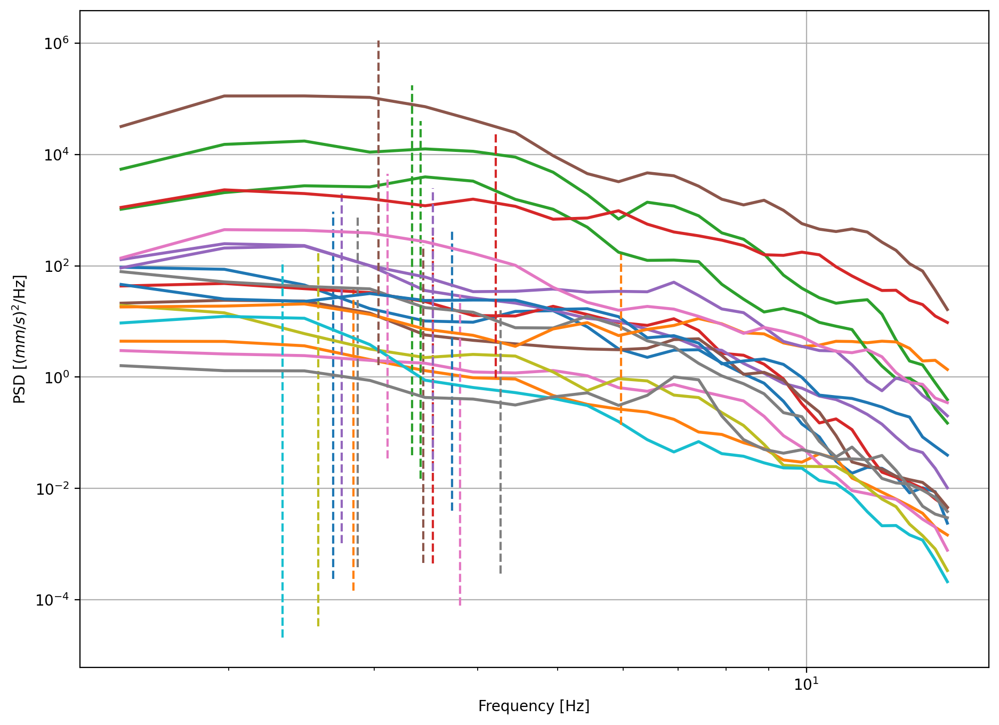

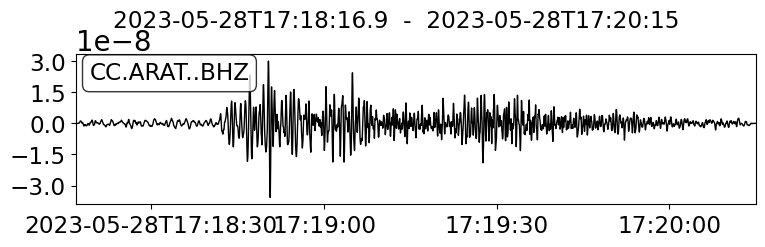

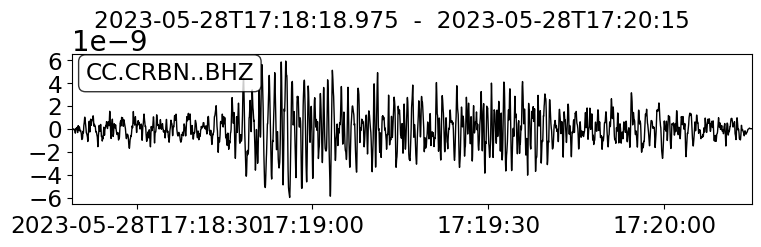

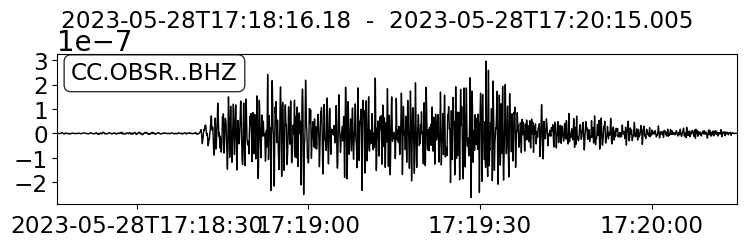

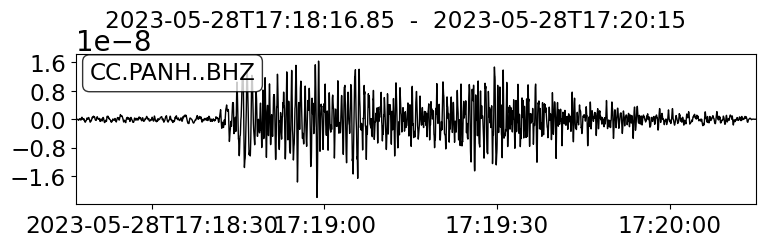

...

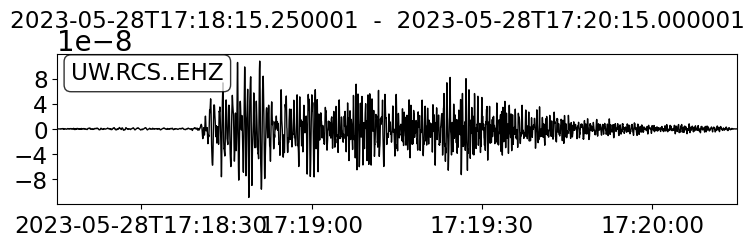

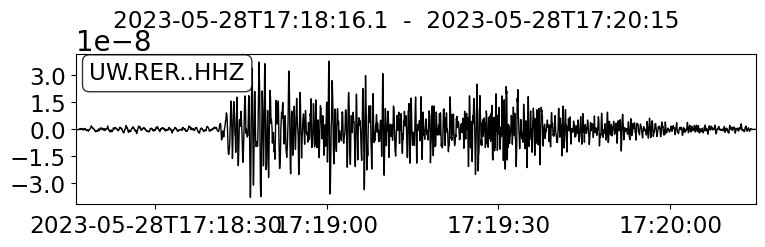

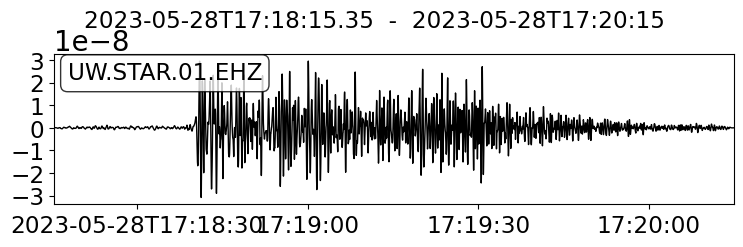

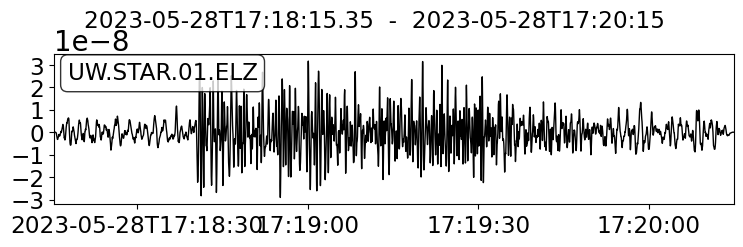

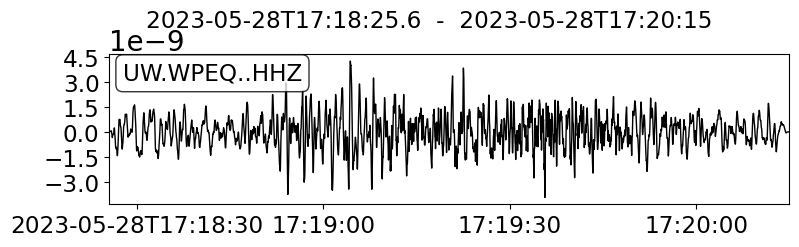

                          otime nets  stas        snr  smb_peak  max_time  \
0   2023-05-28T17:18:00.000000Z   CC  ARAT  20.004558    41.900    -9.775   
1   2023-05-28T17:18:00.000000Z   CC  CRBN   7.759357    43.975     1.450   
2   2023-05-28T17:18:00.000000Z   CC  OBSR  28.363811    41.175    -0.475   
3   2023-05-28T17:18:00.000000Z   CC  PANH  20.897210    41.850    -7.925   
4   2023-05-28T17:18:00.000000Z   CC  PARA  14.065096    41.725    -8.925   
5   2023-05-28T17:18:00.000000Z   CC  PR04  11.189242    43.625    11.100   
6   2023-05-28T17:18:00.000000Z   CC  PR05  13.208063    42.425    36.950   
7   2023-05-28T17:18:00.000000Z   CC  RUSH  17.523104    42.650    30.600   
8   2023-05-28T17:18:00.000000Z   CC  SIFT  15.219227    43.125     7.750   
9   2023-05-28T17:18:00.000000Z   CC  VOIT  14.080952    43.750    38.175   
10  2023-05-28T17:18:00.000000Z   UW   FMW  21.106284    42.050     1.550   
11  2023-05-28T17:18:00.000000Z   UW   LON   9.921785    43.025    -5.150   

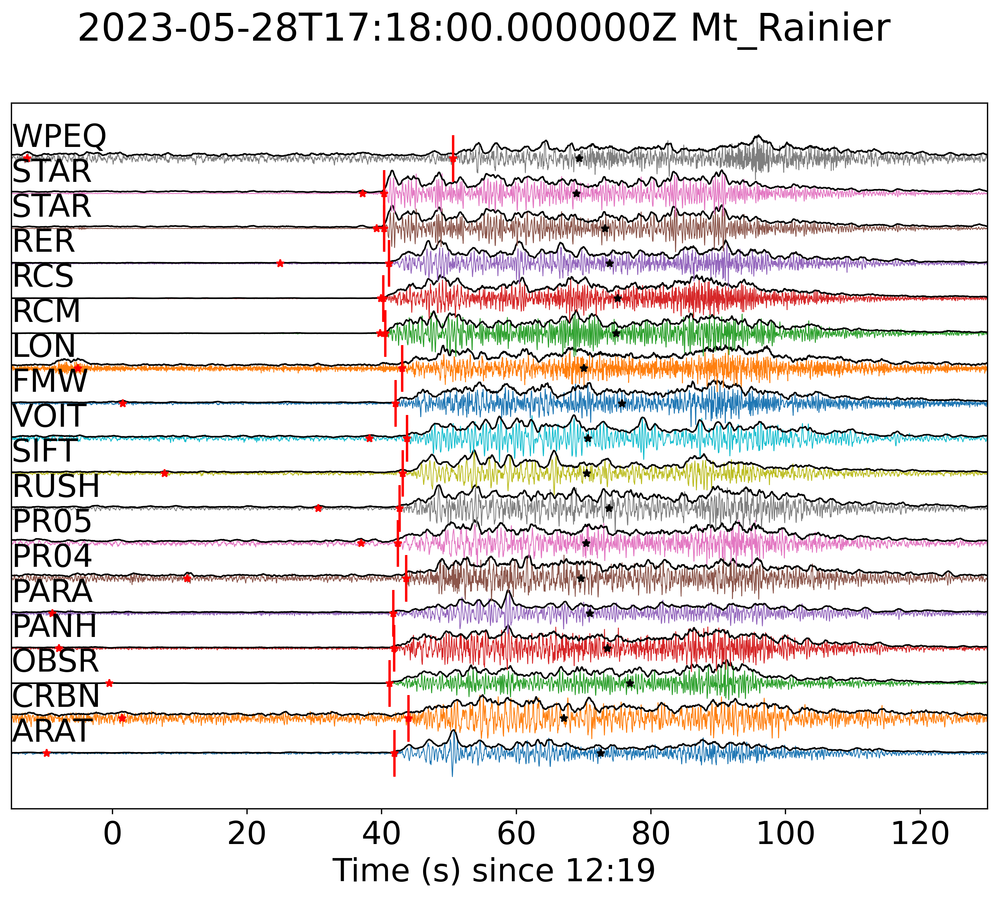

<Figure size 640x480 with 0 Axes>

In [28]:

pdf = PdfPages('../plots/'+ava+'.pdf')
associated_volcano = "Mt_Rainier"
dff=[] 
event_ID = '0000' #str(evt_id[n])
otime = UTCDateTime(2023,5,28,17,18)
associated_volcano="Mt_Rainier"


#get info for stations within 50km of volcano that event ocurred at
stations = df[df['Volcano_Name'] == associated_volcano]['Station'].values.tolist()
networks = df[df['Volcano_Name'] == associated_volcano]['Network'].values.tolist()
latitudes = df[df['Volcano_Name'] == associated_volcano]['Latitude'].values.tolist()
longitudes = df[df['Volcano_Name'] == associated_volcano]['Longitude'].values.tolist()
elevations = df[df['Volcano_Name']== associated_volcano]['Elevation'].values.tolist()


#################### WAVEFORM DOWNLOAD #######################
#Download all waveforms for that event based on stations and times
bulk = [] 
for m in range(0, len(networks)):
    bulk.append([networks[m], stations[m], '*', '*Z', otime-t_before_raw, otime+t_before_raw])
# try:
st = client2.get_waveforms_bulk(bulk)
st = resample(st,fs)  #resampling the data to 40Hz for each trace
evt_data = obspy.Stream()
snr=[]
stas=[]
nets=[]
lats=[]
lons=[]
els=[]
centroid_time = []
data_env_dict = {}
duration = []
max_time = []

# #Keeping all traces for one event with channel z, SNR>10, and bandpassed between 2-12Hz
# ,nets,max_amp_times,durations,data_env_dict,t_diff = [],[],[],[],[],[],[],{},{}
for i,ii in enumerate(st):
    ii.detrend(type = 'demean')
    ii.filter('bandpass',freqmin=low_cut,freqmax=high_cut,corners=2,zerophase=True)
    # trim the data and noise window to exactly 6000 points
    signal_window = ii.copy()
    noise_window = ii.copy()
    signal_window.trim(otime - t_before, otime - t_before + window) # trim the signal at the first pick time of the PNSN data, with loose 40s before
    noise_window.trim(otime - window -t_before, otime - t_before) # noise window of the same length
    if  len(signal_window.data)<=10 or  len(noise_window.data)<=10: continue # skip if no data
    # if not np.percentile(np.abs(signal_window.data),pr):continue # skip if max amplitude is zero
    snr1 = (20 * np.log(np.percentile(np.abs(signal_window.data),pr) 
                    / np.percentile(np.abs(noise_window.data),pr))/np.log(10))
    print("snr",snr1)
    if snr1<thr: # and 100<max_amp_time<200:
        st.remove(ii)
        continue

################# ENVELOPE, CENTROID, DURATION #######################
    # enveloping the data 
    data_envelope = obspy.signal.filter.envelope(signal_window.data)
    data_envelope = obspy.signal.util.smooth(data_envelope, smooth_length)

    data_env_dict[ii.stats.network+'.'+ii.stats.station]= data_envelope/max(np.abs(data_envelope))


    # max time
    # finding the time of max amplitude of each event
    # signal_window is windowed at otime-t_v before the PNSN pick time
    crap = np.argmax(np.abs(data_envelope[:(t_before+40)*fs])) # time of max amplitude relative to otime
    max_time.append(crap/fs)

    # centroid time
    tcrap = signal_window.times()
    it = np.where(tcrap>0)[0]
    centroid_time.append(np.sum(data_envelope*tcrap)/np.sum(data_envelope))
    print(ii.stats.station,max_time[-1],centroid_time[-1])

    # find duration as data starting with the "origin time" and ending when the envelope falls below the mean noise
    noise_envelope = obspy.signal.filter.envelope(noise_window.data)
    data_envelope = obspy.signal.util.smooth(data_envelope, smooth_length)
    mean_noise = np.mean(noise_envelope)
    
    mmax = np.max(np.cumsum(data_envelope**4))
    crap = np.where( np.cumsum(data_envelope**4) <= 0.999*mmax)[0][-1]
    duration.append(crap/fs)


    stas.append(ii.stats.station)
    nets.append(ii.stats.network)
    ista=stations.index(ii.stats.station)
    lats.append(latitudes[ista])
    lons.append(longitudes[ista])
    els.append(elevations[ista])
    snr.append(snr1)
    evt_data.append(signal_window)

    t = evt_data.select(station=stas[-1])[0].times()
    

centroid_time = np.asarray(centroid_time)
centroid_time -= t_before
max_time = np.asarray(max_time)
max_time -= t_before
duration = np.asarray(duration)
duration -= t_before

################### ELEP #######################

    # test the new function
smb_peak= apply_elep(evt_data, stas, \
        list_models, MBF_paras, paras_semblance, t_before)
smb_peak -= t_before


############## PEAK FREQUENCY MEASUREMENTS ############
# Given the approximate measurement of duration, window the signal windows around that
# then measure peak frequency so that there is less noise in it.
# perform this on the Z component only.

char_freq, sharp_weight= [],[]
fig,ax = plt.subplots(1,1,figsize=(11,8), dpi = 200)
for ii,i in enumerate(evt_data):
    data = np.zeros(200*fs)
    crap=i.copy()
    otime1 = crap.stats.starttime + smb_peak[ii] # pick time
    crap.trim(otime1  - 10, otime1 + 2*duration[ii] + 10) # window the data around the pick time
    crap.taper(max_percentage=0.01,max_length=20)

    data[:len(crap.data)] = crap.data #*100
    f,psd=scipy.signal.welch(data,fs=fs,nperseg=81,noverlap=4)
    #just get the frequencies within the filter band
    above_low_cut = [f>low_cut]
    below_high_cut = [f<high_cut]
    in_band = np.logical_and(above_low_cut,below_high_cut)[0]
    f = f[in_band]
    psd = psd[in_band]

    # calculate characteristic frequency and report
    char_freq_max = f[np.argmax(psd)]
    char_freq_mean= np.sum(psd*f)/np.sum(psd)
    psd_cumsum = np.cumsum(psd)
    psd_sum = np.sum(psd)
    char_freq_median = f[np.argmin(np.abs(psd_cumsum-psd_sum/2))]
    char_freq.append(char_freq_mean)

    plt.rcParams.update({'font.size': 20})
    p=ax.plot(f,psd,label=stas[ii],linewidth=2)
    cc = p[0].get_color()
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.grid('True')
    ax.set_xlabel('Frequency [Hz]')
    ax.set_ylabel('PSD [$(mm/s)^2$/Hz]')
    ax.vlines(char_freq_mean,ymin=np.min(psd)/10,ymax=np.max(psd)*10,linestyle="--",colors=cc)
    ax.grid(True)

#             # weighting the data by the spikiness of the PSD vs frequency graphs
    ratio = (np.mean(psd)/np.max(psd))
    sharp_weight.append(int(1/(ratio**2)*20))



##################### get amplitude and energy ###########
MaxD=[];MaxEnv=[];Er=[]
for ii,i in enumerate(evt_data):
    data = np.zeros(200*fs)
    crap=i.copy()

    # get response
    inv = client2.get_stations(network=crap.stats.network, station=crap.stats.station,
                          location=crap.stats.location, channel=crap.stats.channel,
                          level="response", starttime=crap.stats.starttime, endtime=crap.stats.endtime)
    
    # The instrument sensitivity (gain) is stored in the response object
    channel = inv[0][0][0]
    response = channel.response
    gain = response.instrument_sensitivity.value 
    # remove response
    crap.remove_response(inventory=inv,output="DISP")
    otime1 = crap.stats.starttime + smb_peak[ii] # pick time
    crap.trim(otime1  - 10, otime1 + 1.5*duration[ii] + 10) # window the data around the pick time
    crap.taper(max_percentage=0.01,max_length=20)
    crap.plot()


    data_envelope = obspy.signal.filter.envelope(crap.data)
    data_envelope = obspy.signal.util.smooth(crap, smooth_length)

    MaxD.append(np.max(np.abs(crap.data)))
    MaxEnv.append(np.max(np.abs(data_envelope)))


    ## get energy
    crap=i.copy()
    crap.remove_response(inventory=inv,output="VEL")
    otime1 = crap.stats.starttime + smb_peak[ii] # pick time
    crap.trim(otime1  - 10, otime1 + 1.5*duration[ii] + 10) # window the data around the pick time
    crap.taper(max_percentage=0.01,max_length=20)
    Er.append(np.sum(crap.data**2)*crap.stats.sampling_rate)


    ############# KEEP DATA #######################

#         if not max(smb_peak.shape):continue
ddict = {'otime':otime, 'nets':nets, 'stas':stas,  'snr':snr, 'smb_peak': smb_peak, 'max_time':max_time, 'centroid_time': centroid_time , \
         'lats':lats, 'lons':lons, 'elevs':els, 'char_freq':char_freq, 'duration':duration, \
            'sharp_weight':sharp_weight, 'volcano':associated_volcano, 'event_ID':event_ID, \
                'MaxD':MaxD,'MaxEnv':MaxEnv,'ER':Er}
if not np.any(dff):
    dff = pd.DataFrame.from_dict(ddict)
else:
    dff=pd.concat([dff,pd.DataFrame.from_dict(ddict)],ignore_index=True)
print(dff)

fig = plt.figure(figsize = (11,8), dpi=400)
fig.suptitle(str(otime)+" "+associated_volcano)
ax = plt.subplot(1,1,1)
iplot = 0
for i in range(len(stas)):
    data = evt_data.select(station=stas[i])[0].data
    max1 = np.max(np.abs(data))
    t = evt_data.select(station=stas[i])[0].times()
    ax.plot(t-t_before,data/max1+iplot*1.5,linewidth=0.5)
    if np.any(data_env_dict[nets[i]+'.'+stas[i]]):
        ax.plot(t-t_before,data_env_dict[nets[i]+'.'+stas[i]]+iplot*1.5,'k',linewidth=1)
    ax.plot(smb_peak[i],iplot*1.5,'r*',markersize=5)  
    ax.plot(centroid_time[i],iplot*1.5,'k*',markersize=5)  
    ax.plot(max_time[i],iplot*1.5,'r*',markersize=5)  
    ax.set_yticks([])
    plt.text(-15, iplot*1.5+0.5, stas[i])
    print(stas[i],snr[i])
    # if i==ista:
    # err_title=("%s %2.2f (s) error in picks"%(stas[i],smb_peak[i]-t_before))
    # plt.text(60, iplot*1.5+0.5,err_title,color='r')
    plt.vlines(smb_peak[i],iplot*1.5-1.,iplot*1.5+1.,'r')
    print(duration[i],char_freq[i],sharp_weight[i])
    # print(stas[i],smb_peak[i]-t_before)
    iplot+=1
# plt.grid(True)
ax.set_xlim([-t_before,130])
ax.set_xlabel('Time (s) since 12:19 ')
plt.show()
plt.savefig("../plots/" + ava + "_waveforms.png")
plt.clf()
# del fig
pdf.close()
dff.to_csv("../data/events/catalog_" + ava +".csv")

## Event location

### Volcano data



In [29]:

associated_volcano == 'Mt_Rainier'
        
#get info for stations within 50km of volcano that event ocurred at
stations = df[df['Volcano_Name'] == associated_volcano]['Station'].values.tolist()
networks = df[df['Volcano_Name'] == associated_volcano]['Network'].values.tolist()
latitudes = df[df['Volcano_Name'] == associated_volcano]['Latitude'].values.tolist()
longitudes = df[df['Volcano_Name'] == associated_volcano]['Longitude'].values.tolist()
elevations = df[df['Volcano_Name']== associated_volcano]['Elevation'].values.tolist()

############ LOCATION ############################
# input necessary data for grid search
arrivals = dff['smb_peak'].values
# arrivals = dff[dff['event_ID']==event_ID]['smb_peak'].values
sta_lats = dff['lats'].values
sta_lons = dff['lons'].values


Text(0.5, 1.0, 'Travel time Relative to RCS')

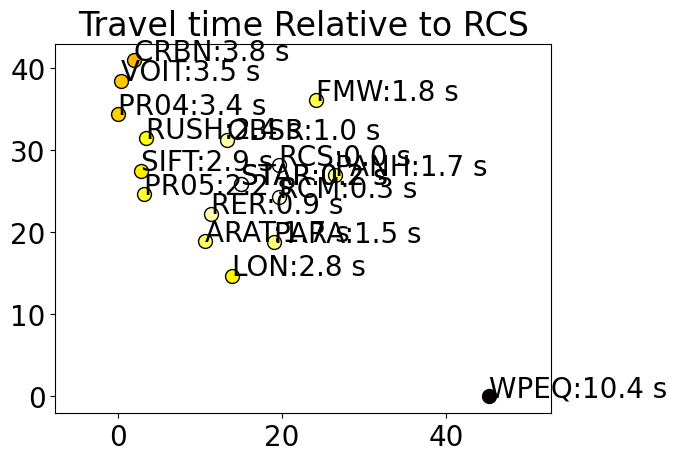

In [30]:
import pyproj


# Define the projection: UTM zone 11 for Washington state
proj = pyproj.Proj(proj='utm', zone=10, ellps='WGS84')

# Convert lat/long to Cartesian in meters
xsta, ysta = proj(sta_lons, sta_lats)
new_xsta =( xsta - np.min(xsta))/1E3
new_ysta = (ysta - np.min(ysta))/1E3

cmap = plt.get_cmap('hot_r')
ista=np.where(arrivals>0)[0]
imin = np.argmin(arrivals[ista])
for i in ista:
    tt = arrivals[i]-np.min(arrivals[ista])
    nmax=np.max(arrivals[ista])-np.min(arrivals[ista])
    plt.plot(new_xsta[i],new_ysta[i],'o',color=cmap(tt/nmax),markersize=10,markeredgecolor='k')
    plt.text(new_xsta[i],new_ysta[i],stas[i]+":"+str(np.ceil(tt*10)/10)+" s")
    plt.axis('equal')
plt.title("Travel time Relative to " + dff['stas'].values[ista[imin]])

Now we are confident that we can do the grid search. let's check the other fields

In [31]:
# center latitude, center longitude, elevation(m), left_trim, right_trim, bottom_trim, top_trim 
volc_lat_lon = {}
volc_lat_lon['Mt_Rainier'] = [46.8528857, -121.7603744, 4392.5]
#Find the lower left corner and grid size based on volcano elevation
# define grid origin in lat,lon and grid dimensions in m
lon_start = -122 #volc_lat_lon[associated_volcano][0]
lon_end = -121.5 #volc_lat_lon[associated_volcano][0]
lat_start = 46.6 #volc_lat_lon[associated_volcano][1]
lat_end = 47 #volc_lat_lon[associated_volcano][1]


proj = pyproj.Proj(proj='utm', zone=10, ellps='WGS84')
if lon_start<0: 
    lon_start1 = lon_start+360
    lon_end1 = lon_end + 360
# Convert lat/long to Cartesian in meters
x_step=100
x1,y1=proj(lon_start,lat_start)
x2,y2=proj(lon_end,lat_end)
# Generate the x and y coordinates for the grid
x_coords = np.arange(x1, x2, x_step)
y_coords = np.arange(y1, y2, x_step)


cmap1 = plt.get_cmap('hot_r')
cmap2 = plt.get_cmap('hsv')


grid search failed to converge in the origin time
(array([0]), array([159]), array([313])) (array([0]), array([159]), array([313]))


/var/folders/js/lzmy975n0l5bjbmr9db291m00000gn/T/ipykernel_47092/2132977443.py:21: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  synthetic_tt[ii,jj] = np.sqrt( (x_coords[ii] - x_best  )**2 + (y_coords[jj] - y_best)**2  ) / vs


0.3649999999999999
[20.00455849]
0.5725000000000001
[7.75935724]
0.2924999999999997
[28.36381133]
0.36000000000000015
[20.8972101]
0.34750000000000014
[14.06509612]
0.5375
[11.18924155]
0.4174999999999997
[13.20806276]
0.43999999999999984
[17.52310375]
0.4875
[15.2192268]
0.55
[14.08095164]
0.3799999999999997
[21.10628417]
0.47749999999999987
[9.92178481]
0.22749999999999987
[28.11056633]
0.2
[28.62683674]
0.28500000000000014
[23.68077846]
0.21000000000000013
[29.55998179 15.60491861]
0.21000000000000013
[29.55998179 15.60491861]
1.2349999999999994
[7.43339305]
[-2.] [-121.78614218] [46.87960855] [592.49088353] [592.49088353]


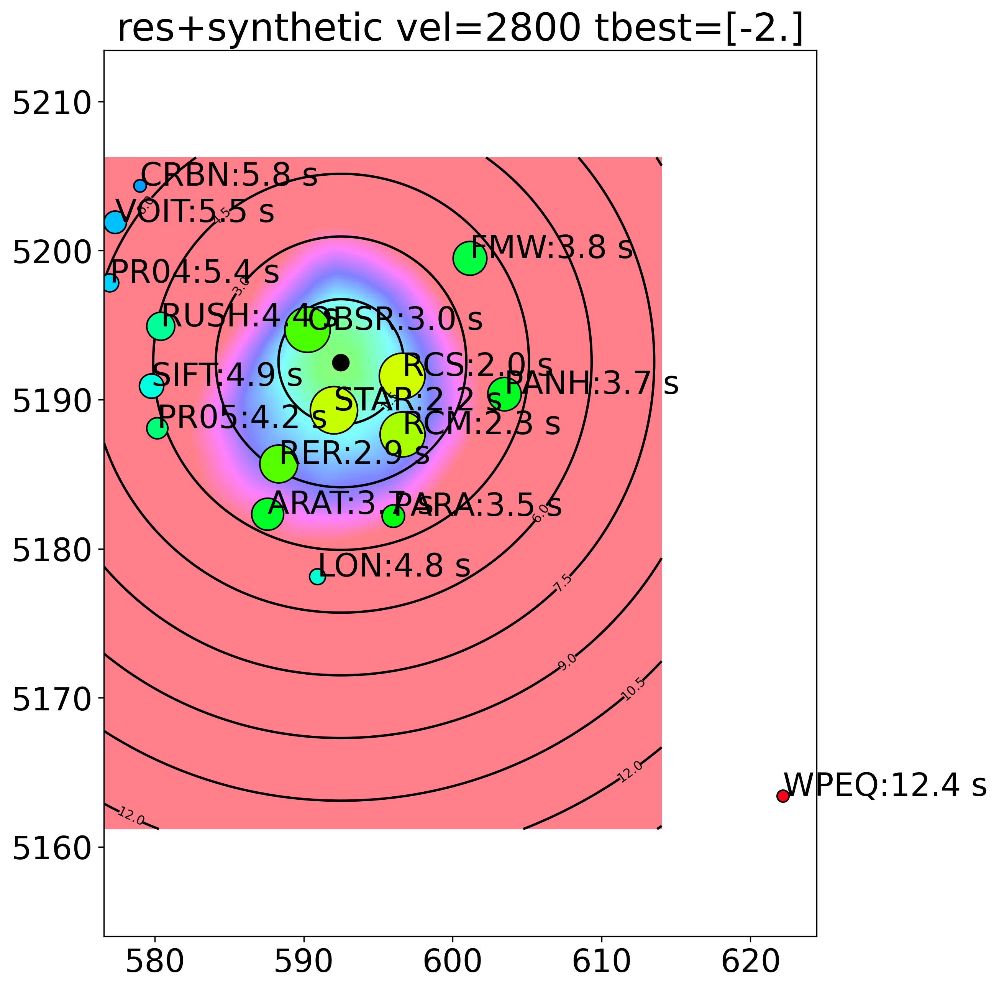

In [34]:

proj = pyproj.Proj(proj='utm', zone=10, ellps='WGS84')
ista =np.where(arrivals>-t_before+0.1)[0]
rss_mat,t_best,lon_best,lat_best,x_best,y_best,idx_best = gridsearch(lat_start,lon_start,\
                                              lat_end,lon_end,\
                                                sta_lats[ista],sta_lons[ista],arrivals[ista],vs=vs)#,
                                                # weight=dff['snr'].values[ista]**2)

oc_idx = np.unravel_index([np.argmin(rss_mat)], rss_mat.shape)

print(oc_idx,idx_best)

# t_best = t0[oc_idx[0]]
x_best = x_coords[oc_idx[1]]
y_best = y_coords[oc_idx[2]]
xxlon_best, xxlat_best = proj(x_best, y_best, inverse=True)
# # print(vs,t_best,lon_best,lat_best)
# # su_x,su_y=proj(lon_best,lat_best)
synthetic_tt = np.zeros((len(x_coords),len(y_coords)))    
for ii in range(len(x_coords)):
        for jj in range(len(y_coords)):
                synthetic_tt[ii,jj] = np.sqrt( (x_coords[ii] - x_best  )**2 + (y_coords[jj] - y_best)**2  ) / vs  
# Existing imshow plot
fig, ax = plt.subplots(figsize=(8, 10), dpi=300)
im = plt.imshow(np.squeeze(rss_mat[oc_idx[0],:,:].T),extent=[x1/1E3,x2/1E3,y1/1E3,y2/1E3], \
                cmap='hsv', interpolation='nearest',origin='lower',vmin=0,vmax=2,alpha=0.5)
contours = plt.contour(synthetic_tt.T, 10, extent=[x1/1E3,x2/1E3,y1/1E3,y2/1E3], colors='black')
plt.clabel(contours, inline=True, fontsize=8)
for ii in ista:
        tt = arrivals[ii]-np.min(arrivals[ista])-t_best
        nmax=np.max(arrivals[ista])-np.min(arrivals[ista])-t_best
        print(tt[0]/10)
        print(dff[dff['stas']==stas[ii]]['snr'].values)
        plt.plot(xsta[ii]/1E3,ysta[ii]/1E3,'o',color=cmap2(tt[0]/10),markersize=dff[dff['stas']==stas[ii]]['snr'].values[0],markeredgecolor='k')
        plt.text(xsta[ii]/1E3,ysta[ii]/1E3,stas[ii]+":"+str(np.ceil(tt[0]*10)/10)+" s")
plt.axis('equal')
plt.plot(x_best/1E3,y_best/1E3,'o',color='k',markersize=10)
plt.title("res+synthetic vel="+str(vs) + ' tbest='+str(t_best))
# # plt.xlim([-122,-121.5]);
plt.savefig("../plots/" + ava+ "_res.png")

# plt.show()
# # lets plot rss_mat to see if we can find the minimum

print(t_best,xxlon_best, xxlat_best ,x_best/1E3 ,x_best/1E3)

## Locate event

In [ ]:
ista =np.where(arrivals>-t_before+0.1)[0]

# origin time


# print(dff['pick'].values[ista])
rss_mat,t_best,lon_best,lat_best,x_best,y_best,idx_best = gridsearch(lat_start,lon_start,\
                                              lat_end,lon_end,\
                                                sta_lats[ista],sta_lons[ista],arrivals[ista],vs=vs)
# t_best1 = t_best
# xxlon_best1 = xxlon_best
# xxlat_best1 = xxlat_best 
# x_best1 = x_best 
# y_best1 = y_best

# t_best,lon_best,lat_best,x_best,y_best = gridsearch_parallel(lat_start,lon_start,\
#                                               lat_end,lon_end,\
#                                                 sta_lats[ista],sta_lons[ista],arrivals[ista],vs=vs)#,
                                              # weight=dff['snr'].values[ista]**2)

print(t_best,lon_best,lat_best,x_best,y_best)
# print(t_best1,xxlon_best1,xxlat_best1,x_best1,y_best1)

# max time
print(dff['max_time'].values[ista])

crap,mt_best,mlon_best,mlat_best,mx_best,my_best,midx_best = gridsearch(lat_start,lon_start,\
                                              lat_end,lon_end,\
                                                sta_lats[ista],sta_lons[ista],dff['max_time'].values[ista],vs=vs)
# mt_best,mlon_best,mlat_best,xm_best,ym_best = gridsearch_parallel(lat_start,lon_start,\
#                                               lat_end,lon_end,\
#                                                 sta_lats[ista],sta_lons[ista],dff['max_time'].values[ista],vs=vs)
print(mt_best,mlon_best,mlat_best)

# centroid time
print(dff['centroid_time'].values[ista])
# ct_best,clon_best,clat_best,xc_best,yc_best = gridsearch_parallel(lat_start,lon_start,\
#                                               lat_end,lon_end,\
#                                                 sta_lats[ista],sta_lons[ista],dff['centroid_time'].values[ista],vs=vs)
crap,ct_best,clon_best,clat_best,cx_best,cy_best,idx_best = gridsearch(lat_start,lon_start,\
                                              lat_end,lon_end,\
                                                sta_lats[ista],sta_lons[ista],dff['centroid_time'].values[ista],vs=vs)

print(ct_best,clon_best,clat_best)

grid search failed to converge in the origin time
[-2.] [-121.78614218] [46.87960855] [592490.88352976] [5192500.77436475]
[ -9.775   1.45   -0.475  -7.925  -8.925  11.1    36.95   30.6     7.75
  38.175   1.55   -5.15   39.775  39.875  24.925  39.25   37.175 -12.65 ]
grid search failed to converge in the latitude
[-0.1] [-121.51183162] [46.59469064]
[72.57252557 67.0615881  76.87032023 73.52486958 70.92811554 69.63209868
 70.37728116 73.76474474 70.46884612 70.62142499 75.69924225 70.06263964
 74.85565343 75.07465952 73.86738015 73.18819797 68.95893013 69.3768033 ]
grid search failed to converge in the origin time
[-2.] [-121.99099777] [46.73311163]


/var/folders/js/lzmy975n0l5bjbmr9db291m00000gn/T/ipykernel_80831/4220735733.py:4: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  synthetic_tt[ii,jj] = np.sqrt( (x_coords[ii] - x_best  )**2 + (y_coords[jj] - y_best)**2  ) / vs


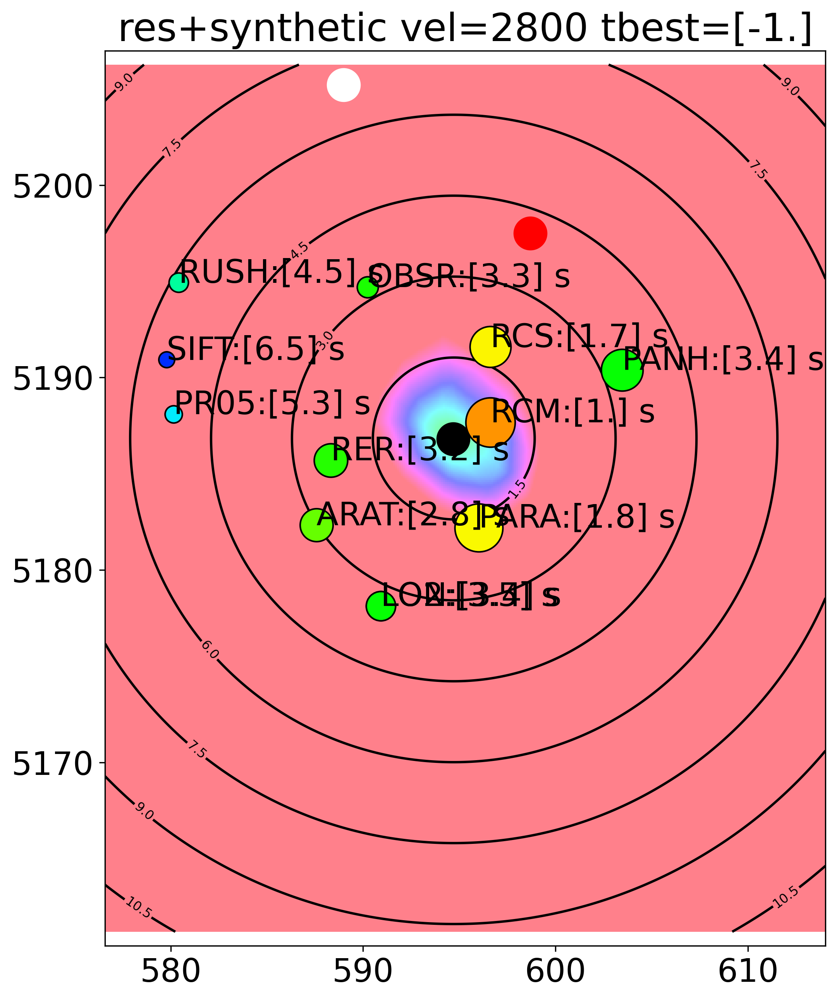

In [ ]:

synthetic_tt = np.zeros((len(x_coords),len(y_coords)))    
for ii in range(len(x_coords)):
        for jj in range(len(y_coords)):
                synthetic_tt[ii,jj] = np.sqrt( (x_coords[ii] - x_best  )**2 + (y_coords[jj] - y_best)**2  ) / vs  
# Existing imshow plot
fig, ax = plt.subplots(figsize=(8, 10), dpi=300)
im = plt.imshow(np.squeeze(rss_mat[oc_idx[0],:,:].T),extent=[x1/1E3,x2/1E3,y1/1E3,y2/1E3], \
                cmap='hsv', interpolation='nearest',origin='lower',vmin=0,vmax=1,alpha=0.5)
contours = plt.contour(synthetic_tt.T, 10, extent=[x1/1E3,x2/1E3,y1/1E3,y2/1E3], colors='black')
plt.clabel(contours, inline=True, fontsize=8)
plt.plot(x_best/1E3,y_best/1E3,'o',color='k',markersize=20)
plt.plot(mx_best/1E3,my_best/1E3,'o',color='r',markersize=20)
plt.plot(cx_best/1E3,cy_best/1E3,'o',color='w',markersize=20)
for ii in ista:
        tt = arrivals[ii]-np.min(arrivals[ista])-t_best
        nmax=np.max(arrivals[ista])-np.min(arrivals[ista])-t_best
        plt.plot(xsta[ii]/1E3,ysta[ii]/1E3,'o',color=cmap2(tt/10),markersize=dff[dff['stas']==stas[ii]]['snr'].values,markeredgecolor='k')
        plt.text(xsta[ii]/1E3,ysta[ii]/1E3,stas[ii]+":"+str(np.ceil(tt*10)/10)+" s")
plt.axis('equal')
plt.plot(x_best/1E3,y_best/1E3,'o',color='k',markersize=10)
plt.title("res+synthetic vel="+str(vs) + ' tbest='+str(t_best))
# # plt.xlim([-122,-121.5]);
plt.savefig("../plots/" + ava+ "_OCM_res.png")

## DEM

We need to reproject the DEM onto our own grid (x_coord, y_coord)s

In [35]:

import rasterio
from matplotlib.colors import LightSource
from rasterio.warp import transform_bounds,  reproject, Resampling , calculate_default_transform
from rasterio.transform import array_bounds

In [36]:
associated_volcano = 'Mt_Rainier'
        
#get info for stations within 50km of volcano that event ocurred at
stations = df[df['Volcano_Name'] == associated_volcano]['Station'].values.tolist()
networks = df[df['Volcano_Name'] == associated_volcano]['Network'].values.tolist()
latitudes = df[df['Volcano_Name'] == associated_volcano]['Latitude'].values.tolist()
longitudes = df[df['Volcano_Name'] == associated_volcano]['Longitude'].values.tolist()
elevations = df[df['Volcano_Name']== associated_volcano]['Elevation'].values.tolist()


In [37]:
# center latitude, center longitude, elevation(m), left_trim, right_trim, bottom_trim, top_trim 
volc_lat_lon = {}
volc_lat_lon['Mt_Rainier'] = [46.8528857, -121.7603744, 4392.5]
#Find the lower left corner and grid size based on volcano elevation
# define grid origin in lat,lon and grid dimensions in m
lon_start = -121.9 #volc_lat_lon[associated_volcano][0]
lon_end = -121.65 #volc_lat_lon[associated_volcano][0]
lat_start = 46.6 #volc_lat_lon[associated_volcano][1]
lat_end = 47 #volc_lat_lon[associated_volcano][1]


# Create a light source
ls = LightSource(azdeg=315, altdeg=45)


# Load the DEM with rasterio
with rasterio.open('../data/geospatial/Mt_Rainier/Mt_Rainier.tif') as src:
    dem = src.read(1)  # read the first band
    transform = src.transform
    bounds = src.bounds
    crs=src.crs
    # dem = dem.astype('float64')
    dem[dem == -32767] = np.nan #gets rid of edge effects
    # dem = np.nan_to_num(dem,nan=1000)


# Define the target CRS
epsg_code = 32600 + 10
# dst_crs = 'EPSG:4326'  # EPSG:4326 is the code for WGS84 lat/lon
dst_crs = 'epsg:{}'.format(epsg_code) #pyproj.Proj(init=)
# Calculate the transform and dimensions for the reprojected DEM
transform_latlon, width, height = calculate_default_transform(crs, dst_crs, dem.shape[1], dem.shape[0], *bounds)


# Create an empty array for the reprojected DEM
dem_latlon = np.empty(shape=(height, width))

# Reproject the DEM
reproject(
    source=dem,
    destination=dem_latlon,
    src_transform=transform,
    src_crs=crs,
    dst_transform=transform_latlon,
    dst_crs=dst_crs,
    resampling=Resampling.nearest)

# Transform the bounds to the target CRS
left, bottom, right, top = transform_bounds(crs, dst_crs, *bounds)

# Calculate the illumination intensity
illumination = ls.hillshade(dem_latlon)
# new bounds
left, bottom, right, top = array_bounds(height, width, transform_latlon)

/var/folders/js/lzmy975n0l5bjbmr9db291m00000gn/T/ipykernel_47092/844045225.py:65: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_xticklabels(xticks_new );
/var/folders/js/lzmy975n0l5bjbmr9db291m00000gn/T/ipykernel_47092/844045225.py:66: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(yticks_new );


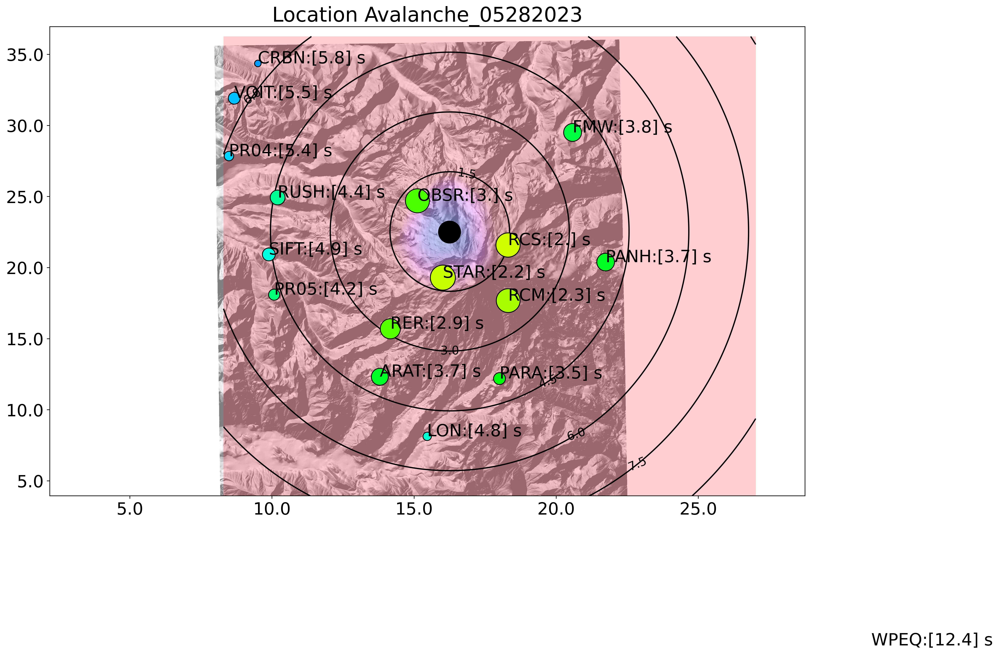

In [39]:


fig, ax = plt.subplots(figsize=(16, 10), dpi=400)

# find the right UTM zone for the data
def get_utm_zone(longitude):
    return int((longitude + 180) / 6) + 1
utm_zone = get_utm_zone(np.mean(sta_lons))
# # Define the projection: UTM zone 11 for Washington state
proj = pyproj.Proj(proj='utm', zone=utm_zone, ellps='WGS84')
# Convert lat/long to Cartesian in meters
xsta, ysta = proj(sta_lons, sta_lats)
cmap = plt.get_cmap('hot_r')

plt.imshow(illumination, extent=[left/1E3, right/1E3, bottom/1E3,top/1E3 ], cmap='gray',clim=[0,1],alpha=0.5,aspect='equal');
# plt.imshow(illumination, extent=[lon_start, lon_end, lat_start, lat_end], cmap='gray',\
    # clim=[0,1],alpha=0.5,aspect='equal')

issta=np.argmin(arrivals[ista])
stass=stas[ista[issta]]

# Plot the origin
# plt.plot(lon_best,lat_best,'*',color='r',markersize=20,markeredgecolor='k')

plt.title(str(dff[dff['event_ID']==event_ID]['otime'].values[0])[0:13]+ " Travel time Relative to "+stass);

contours = plt.contour(synthetic_tt.T, 10, extent=[x1/1E3,x2/1E3,y1/1E3,y2/1E3], colors='black')
# im = plt.imshow(np.squeeze(rss_mat[0,:,:].T),extent=[lon_start,lon_end,lat_start,lat_end], cmap='hsv', interpolation='nearest',origin='lower')

# Add contour lines
num_contour_lines = 20  # Change this to the number of contour lines you want
im = plt.imshow(np.squeeze(rss_mat[oc_idx[0],:,:].T),extent=[x1/1E3,x2/1E3,y1/1E3,y2/1E3], \
                cmap='hsv', interpolation='nearest',origin='lower',vmin=0,vmax=1,alpha=0.2)
contours = plt.contour(synthetic_tt.T, 10, extent=[x1/1E3,x2/1E3,y1/1E3,y2/1E3], colors='black',linewidths=0.1)
plt.clabel(contours, inline=True, fontsize=14)
plt.plot(x_best/1E3,y_best/1E3,'o',color='k',markersize=10)
# plt.plot(mx_best/1E3,my_best/1E3,'o',color='r',markersize=20)
# plt.plot(cx_best/1E3,cy_best/1E3,'o',color='w',markersize=20)
for ii in ista:
        tt = arrivals[ii]-np.min(arrivals[ista])-t_best
        nmax=np.max(arrivals[ista])-np.min(arrivals[ista])-t_best
        plt.plot(xsta[ii]/1E3,ysta[ii]/1E3,'o',color=cmap2(tt/10),markersize=dff[dff['stas']==stas[ii]]['snr'].values[0],markeredgecolor='k')
        plt.text(xsta[ii]/1E3,ysta[ii]/1E3,stas[ii]+":"+str(np.ceil(tt*10)/10)+" s")
plt.axis('equal')
plt.plot(x_best/1E3,y_best/1E3,'o',color='k',markersize=26)

# Get the current xticks and yticks
xticks = ax.get_xticks()
yticks = ax.get_yticks()

# Calculate the bottom left corner coordinates
bottom_left_x = left/1E3
bottom_left_y = bottom/1E3

# Calculate the range of x and y
x_range = right/1E3 - left/1E3
y_range = top/1E3 - bottom/1E3

# Create new xticks and yticks every 5 km
xticks_new = np.arange(0, x_range, 5)
yticks_new = np.arange(0, y_range, 5)
# # Set the new xticks and yticks labels
# ax.set_xticks(xticks_new)
# ax.set_yticks(yticks_new)
plt.xlim([10+bottom_left_x,20+bottom_left_x])
plt.ylim([10+bottom_left_y,43+bottom_left_y])
ax.set_xticklabels(xticks_new );
ax.set_yticklabels(yticks_new );
plt.title("Location "+ava);
plt.savefig("../plots/" + ava+ "_location.png")

## Doppler effects?

[-0.44268136  5.23735987  3.41676978]


/var/folders/js/lzmy975n0l5bjbmr9db291m00000gn/T/ipykernel_47092/191792224.py:6: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  source_location_rad = (math.radians(source_location[0]), math.radians(source_location[1]))


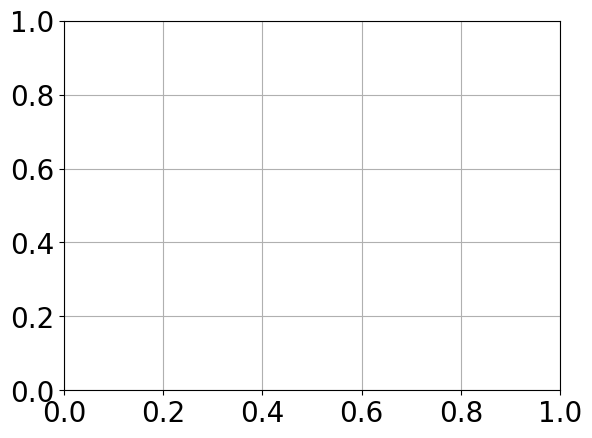

In [40]:
import matplotlib.pyplot as plt
import math
# Calculate the azimuth between the stations and the source location
def calculate_azimuth(row):
    station_location = (math.radians(row['lats']), math.radians(row['lons']))
    source_location_rad = (math.radians(source_location[0]), math.radians(source_location[1]))
    
    delta_lon = station_location[1] - source_location_rad[1]
    
    numerator = math.sin(delta_lon) * math.cos(station_location[0])
    denominator = math.cos(source_location_rad[0]) * math.sin(station_location[0]) - math.sin(source_location_rad[0]) * math.cos(station_location[0]) * math.cos(delta_lon)
    
    azimuth = math.atan2(numerator, denominator)
    azimuth = math.degrees(azimuth)
     
    # Convert azimuth to range [0, 360]
    # if azimuth < 0:
    #     azimuth += 360
    
    return azimuth
# Assume source_location is a tuple (latitude, longitude)
source_location = (lat_best, lon_best)

# Calculate the azimuth between the stations and the source location
dff['azimuth'] = dff.apply(calculate_azimuth, axis=1)

## Fit a doppler function
# Prepare data
x_data = np.radians(dff['azimuth'].values[ista])
y_data = dff['char_freq'].values[ista]

# Initial guess for the parameters
initial_guess = [0, 2*np.pi,  0]

# Fit the function to the data
params, params_covariance = curve_fit(doppler_func, x_data, y_data, p0=initial_guess)

print(params)

az=np.linspace(-np.pi,np.pi,100)
dop = doppler_func(az,params[0],params[1],params[2])

# Plot the characteristic frequency as a function of azimuth
plt.figure(figsize=(10, 6))
for station in dff['stas'].unique():
    station_data = dff[dff['stas'] == station]
    plt.plot(station_data['azimuth'], station_data['char_freq'],'o',markersize=14, label=station)
plt.plot(np.degrees(az),dop,label='l2')
plt.xlabel('Azimuth (degrees)')
plt.ylabel('Characteristic Frequency (Hz)')
plt.legend(loc='upper right',fontsize=10)
plt.grid(True)
plt.show()

[-0.78794854  5.97575527  3.49272876]


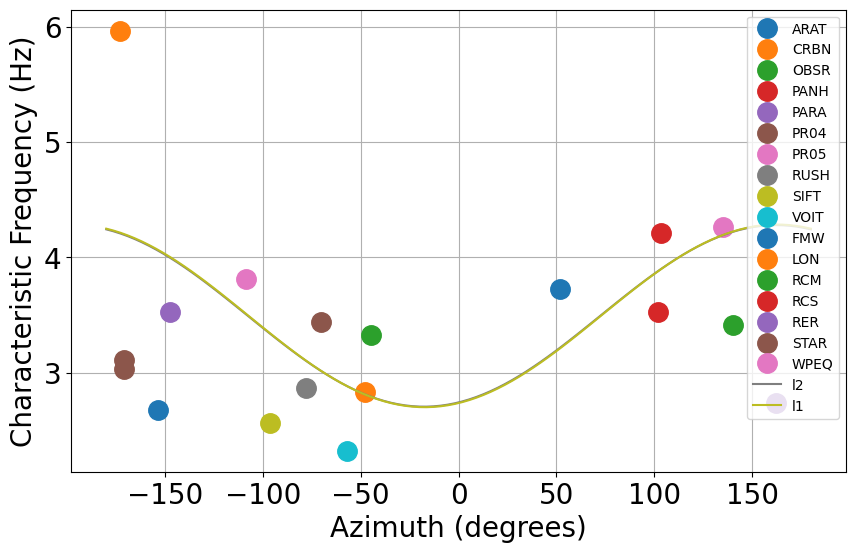

In [42]:
from scipy.optimize import least_squares

# Define the residuals function
def residuals_func(params, x_data, y_data,weight):
    return (y_data - doppler_func(x_data, *params))*weight

# Initial guess for the parameters
initial_guess = [0, 2*np.pi,  0]

# Fit the function to the data using L1 norm minimization
result = least_squares(residuals_func, initial_guess, args=(x_data, y_data,1/dff['snr'].values[ista]), loss='soft_l1')

# The optimized parameters are stored in result.x
params = result.x

print(params)

az=np.linspace(-np.pi,np.pi,100)
dop = doppler_func(az,params[0],params[1],params[2])


# Fit the function to the data
params, params_covariance = curve_fit(doppler_func, x_data, y_data, p0=initial_guess,sigma=dff['snr'].values[ista])
dop2 = doppler_func(az,params[0],params[1],params[2])

# Plot the characteristic frequency as a function of azimuth
plt.figure(figsize=(10, 6))
for station in dff['stas'].unique():
    station_data = dff[dff['stas'] == station]
    plt.plot(station_data['azimuth'], station_data['char_freq'],'o',markersize=14, label=station)
plt.plot(np.degrees(az),dop,label='l2')
plt.plot(np.degrees(az),dop2,label='l1')
plt.xlabel('Azimuth (degrees)')
plt.ylabel('Characteristic Frequency (Hz)')
plt.legend(loc='upper right',fontsize=10)
plt.grid(True)
plt.show()

In [45]:
if params[0]<0:
    direction = params[1]+np.pi 
else:
    direction = params[1]   
fmax = max(dop)
fmin = min(dop)
v = vs*((fmax-fmin)/(fmax+fmin))
print(direction,v)


9.12315578316882 631.5669051546661


In [46]:
dff['flow_dir'] = direction
dff['flow_speed'] = v

## Measure magnitude and radiated energy


We may need to figure out the wave types using polarization.

We will assume a body wave magnitude because the wavespeeds are quite high.

In [47]:
dff['xsta']=xsta
dff['ysta']=ysta
dff['xbest']=x_best*np.ones(len(xsta))
dff['ybest']=y_best*np.ones(len(xsta))

evlon,evlat = proj(x_best,y_best,inverse=True)
dff['evlat']=evlat*np.ones(len(xsta))
dff['evlon']=evlon*np.ones(len(xsta))

dist=[]
for ista in range(len(xsta)):
    crap=np.sqrt( (xsta[ista] - x_best)**2 + (ysta[ista] - y_best)**2)
    dist.append(crap[0])

dff['dist']=dist

## Get magnitude

Follow the relation from Lin et al, 2015:
$ Lm = \log(A)+0.55 \log(dist) + 2.44$

where $A$ is in micrometers (1E-6 meters) and $dist$ is in km.

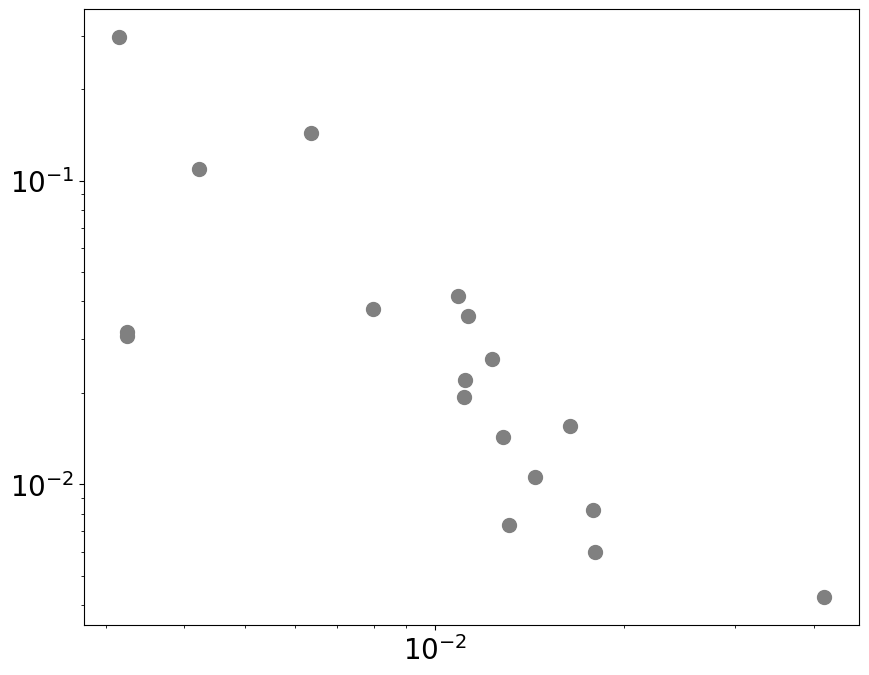

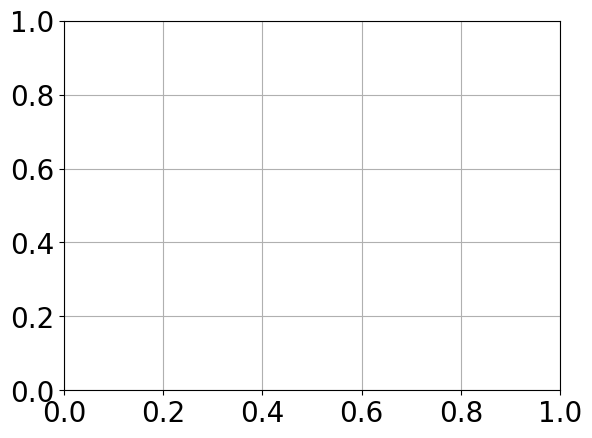

In [59]:
crap = np.zeros(len(xsta))
crap2 = np.zeros(len(xsta))
fig,ax=plt.subplots(figsize=(10,8))
for ista in range(len(xsta)):
    A = dff['MaxD'].values[ista]*1E6
    A2 = dff['MaxEnv'].values[ista]*1E6
    d = dff['dist'].values[ista]/1E3
    crap[ista]=  np.log(A) + 0.55*np.log(d)+2.44
    crap2[ista]=  np.log(A2) + 0.55*np.log(d)+2.44
    ax.plot(d/1E3,A,'o',color="grey",markersize=10)
    
plt.xscale('log')
plt.yscale('log')
plt.grid(True)
plt.show()
dff['Lm_sta_D']=crap
dff['Lm_evt_D'] = np.median(crap)
dff['Lm_sta_Env']=crap2
dff['Lm_evt_Env'] = np.median(crap2)



dff.to_csv("../data/events/catalog_" + ava +".csv",index=False)

In [49]:
dff

,otime,nets,stas,snr,smb_peak,max_time,centroid_time,lats,lons,elevs,...,ysta,xbest,ybest,evlat,evlon,dist,Lm_sta_D,Lm_evt_D,Lm_sta_Env,Lm_evt_Env
0,2023-05-28T17:18:00.000000Z,CC,ARAT,20.004558,41.900,-9.775,72.572526,46.788755,-121.852537,1823.137,...,5.182329e+06,592490.88353,5.192501e+06,46.879609,-121.786142,11295.585237,0.441352,-0.179578,-1.460317,-2.013803
1,2023-05-28T17:18:00.000000Z,CC,CRBN,7.759357,43.975,1.450,67.061588,46.988131,-121.961063,499.080,...,5.204369e+06,592490.88353,5.192501e+06,46.879609,-121.786142,17965.986637,-1.088973,-0.179578,-2.252248,-2.013803
2,2023-05-28T17:18:00.000000Z,CC,OBSR,28.363811,41.175,-0.475,76.870320,46.899719,-121.815331,2382.000,...,5.194702e+06,592490.88353,5.192501e+06,46.879609,-121.786142,3152.911623,1.854081,-0.179578,-0.276846,-2.013803
3,2023-05-28T17:18:00.000000Z,CC,PANH,20.897210,41.850,-7.925,73.524870,46.859032,-121.642592,2086.000,...,5.190393e+06,592490.88353,5.192501e+06,46.879609,-121.786142,11177.782259,-0.049066,-0.179578,-1.971951,-2.013803
4,2023-05-28T17:18:00.000000Z,CC,PARA,14.065096,41.725,-8.925,70.928116,46.786442,-121.742149,1651.180,...,5.182201e+06,592490.88353,5.192501e+06,46.879609,-121.786142,10884.194891,0.572721,-0.179578,-1.617042,-2.013803
5,2023-05-28T17:18:00.000000Z,CC,PR04,11.189242,43.625,11.100,69.632099,46.929694,-121.988976,912.700,...,5.197847e+06,592490.88353,5.192501e+06,46.879609,-121.786142,16421.465988,-0.180759,-0.179578,-2.092929,-2.013803
6,2023-05-28T17:18:00.000000Z,CC,PR05,13.208063,42.425,36.950,70.377281,46.841649,-121.948912,1553.000,...,5.188104e+06,592490.88353,5.192501e+06,46.879609,-121.786142,13105.481134,-1.057993,-0.179578,-2.134984,-2.013803
7,2023-05-28T17:18:00.000000Z,CC,RUSH,17.523104,42.650,30.600,73.764745,46.903060,-121.944390,1235.000,...,5.194932e+06,592490.88353,5.192501e+06,46.879609,-121.786142,12334.845158,0.163825,-0.179578,-1.373850,-2.013803
8,2023-05-28T17:18:00.000000Z,CC,SIFT,15.219227,43.125,7.750,70.468846,46.867092,-121.953246,720.900,...,5.190927e+06,592490.88353,5.192501e+06,46.879609,-121.786142,12811.055463,-0.404576,-0.179578,-2.385859,-2.013803
9,2023-05-28T17:18:00.000000Z,CC,VOIT,14.080952,43.750,38.175,70.621425,46.966330,-121.983400,977.100,...,5.201924e+06,592490.88353,5.192501e+06,46.879609,-121.786142,17845.784886,-0.774343,-0.179578,-2.246228,-2.013803
